In [347]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import cdist
from matplotlib.gridspec import GridSpec

In [348]:
X = pd.read_excel("C:/Users/wkaco/Desktop/Assets_data.xlsx")
macro_data = pd.read_excel("C:/Users/wkaco/Desktop/CPIGDP.xlsx").interpolate().drop("DATE", axis=1)

macro_data.fillna(method="ffill")


C:\Users\wkaco\AppData\Local\Temp\ipykernel_23332\54767886.py:4: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  macro_data.fillna(method="ffill")


,All items less medical care,All items less energy,All items less food,All items less food and energy,All Items less shelter,Apparel less footwear,Commodities,Commodities less food,Commodities less food and beverages,Commodites less food and energy commodities,...,Structures,Equipment,Intellectual Property Products,Residential Fixed Investment,Change in Private Inventories,National Defense,Nondefense,State and Local,Exports of Goods and Services,Imports of Goods and Services
0,219.007,227.893,227.180,227.877,219.997,120.001,186.508,164.411,161.906,147.079,...,470.093000,930.892000,645.438000,414.107000,80.278000,824.076000,472.015000,1847.934000,2189.981000,2792.253000
1,219.490,228.015,227.758,228.034,220.509,119.591,187.426,165.692,163.197,147.093,...,476.090667,939.648333,648.201667,415.833667,83.987333,821.387333,472.204000,1845.904667,2198.516000,2788.444333
2,219.928,228.458,228.240,228.478,220.975,120.334,187.863,166.113,163.637,147.217,...,482.088333,948.404667,650.965333,417.560333,87.696667,818.698667,472.393000,1843.875333,2207.051000,2784.635667
3,220.272,228.888,228.609,228.905,221.280,120.760,188.067,166.215,163.739,147.287,...,488.086000,957.161000,653.729000,419.287000,91.406000,816.010000,472.582000,1841.846000,2215.586000,2780.827000
4,219.725,229.183,228.028,229.224,220.457,120.954,186.810,164.435,161.907,147.418,...,486.958333,956.227667,654.803667,424.104667,89.080333,817.411333,472.913000,1843.005000,2219.635333,2770.823667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,300.285,317.525,309.739,316.698,283.067,122.332,223.794,179.818,176.079,165.597,...,915.672333,1316.220333,1596.523333,1181.945000,71.662667,1043.774333,787.764667,3090.808333,3144.687667,4029.791000
147,301.191,318.326,310.851,317.622,283.849,124.152,224.316,180.471,176.740,165.421,...,916.042000,1326.467000,1602.738000,1182.582000,96.792000,1051.468000,790.711000,3100.862000,3154.321000,4061.192000
148,301.077,318.834,310.805,318.140,283.228,123.738,223.522,179.303,175.543,165.348,...,913.575000,1337.967000,1612.743000,1181.637667,89.851333,1064.746667,794.521333,3114.428667,3176.311333,4095.453000
149,300.848,319.122,310.486,318.346,282.703,124.044,222.719,178.009,174.214,165.144,...,911.108000,1349.467000,1622.748000,1180.693333,82.910667,1078.025333,798.331667,3127.995333,3198.301667,4129.714000


In [349]:
macro_data = pd.DataFrame((macro_data - macro_data.shift(1))/macro_data.shift(1)).dropna()


In [350]:
macro_data

,All items less medical care,All items less energy,All items less food,All items less food and energy,All Items less shelter,Apparel less footwear,Commodities,Commodities less food,Commodities less food and beverages,Commodites less food and energy commodities,...,Structures,Equipment,Intellectual Property Products,Residential Fixed Investment,Change in Private Inventories,National Defense,Nondefense,State and Local,Exports of Goods and Services,Imports of Goods and Services
1,0.002205,0.000535,0.002544,0.000689,0.002327,-0.003417,0.004922,0.007791,0.007974,0.000095,...,0.012758,0.009406,0.004282,0.004170,0.046206,-0.003263,0.000400,-0.001098,0.003897,-0.001364
2,0.001996,0.001943,0.002116,0.001947,0.002113,0.006213,0.002332,0.002541,0.002696,0.000843,...,0.012598,0.009319,0.004264,0.004152,0.044165,-0.003273,0.000400,-0.001099,0.003882,-0.001366
3,0.001564,0.001882,0.001617,0.001869,0.001380,0.003540,0.001086,0.000614,0.000623,0.000475,...,0.012441,0.009233,0.004245,0.004135,0.042297,-0.003284,0.000400,-0.001101,0.003867,-0.001368
4,-0.002483,0.001289,-0.002541,0.001394,-0.003719,0.001606,-0.006684,-0.010709,-0.011189,0.000889,...,-0.002310,-0.000975,0.001644,0.011490,-0.025443,0.001717,0.000700,0.000629,0.001828,-0.003597
5,-0.001333,0.001785,-0.001289,0.001741,-0.001851,-0.006234,-0.005209,-0.009165,-0.009672,0.000651,...,-0.002316,-0.000976,0.001641,0.011360,-0.026108,0.001714,0.000700,0.000629,0.001824,-0.003610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,0.003687,0.003216,0.004212,0.003590,0.003556,0.007005,0.001141,0.001219,0.001228,-0.001525,...,0.000404,0.007846,0.003908,0.000539,0.540029,0.007426,0.003754,0.003263,0.003073,0.007853
147,0.003017,0.002523,0.003590,0.002918,0.002763,0.014878,0.002333,0.003631,0.003754,-0.001063,...,0.000404,0.007785,0.003893,0.000539,0.350661,0.007371,0.003740,0.003253,0.003063,0.007792
148,-0.000378,0.001596,-0.000148,0.001631,-0.002188,-0.003335,-0.003540,-0.006472,-0.006773,-0.000441,...,-0.002693,0.008670,0.006242,-0.000799,-0.071707,0.012629,0.004819,0.004375,0.006971,0.008436
149,-0.000761,0.000903,-0.001026,0.000648,-0.001854,0.002473,-0.003592,-0.007217,-0.007571,-0.001234,...,-0.002700,0.008595,0.006204,-0.000799,-0.077246,0.012471,0.004796,0.004356,0.006923,0.008366


In [351]:


def elbow_method_gmm(data, n_clusters_range=(1, 40)):
    """
    Perform elbow method analysis for Gaussian Mixture Models.
    
    Parameters:
    data: DataFrame with macro features
    n_clusters_range: tuple, range of clusters to try (min, max)
    """
    # Standardize the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)
    
    meandist = []
    n_clusters = range(n_clusters_range[0], n_clusters_range[1])
    
    for n_cluster in n_clusters:
        gmm = GaussianMixture(n_components=n_cluster, random_state=42)
        gmm.fit(data_scaled)
        bic_score = gmm.bic(data_scaled)
        meandist.append(bic_score)
    
    return n_clusters, meandist

def plot_elbow(n_clusters, scores, title):
    """Plot the elbow curve."""
    plt.figure(figsize=(10, 6))
    plt.plot(list(n_clusters), scores, 'bo-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('BIC Score')
    plt.title(f'GMM Clustering Elbow Method: {title}')
    plt.grid(True)
    plt.show()

def analyze_clustering(macro_data):
    """Analyze clustering for all macro features."""
    # Select all numerical features for analysis
    numeric_features = macro_data.select_dtypes(include=[np.number]).columns.tolist()
    
    # Individual feature analysis
    for feature in numeric_features:
        feature_clusters, feature_scores = elbow_method_gmm(macro_data[[feature]])
        plot_elbow(feature_clusters, feature_scores, feature)
    
    # Combined analysis of all features
    combined_clusters, combined_scores = elbow_method_gmm(macro_data[numeric_features])
    plot_elbow(combined_clusters, combined_scores, 'All Features Combined')

def fit_optimal_gmm(data, n_components):
    """Fit GMM with optimal number of components."""
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)
    
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(data_scaled)
    labels = gmm.predict(data_scaled)
    
    return gmm, labels, scaler

def plot_gmm_analysis(macro_data, X, cluster_labels, gmm_model, scaler):
    """Create comprehensive visualizations for GMM clustering analysis."""
    plt.style.use('seaborn')
    
    # Create figure with multiple subplots
    fig = plt.figure(figsize=(20, 30))
    gs = GridSpec(6, 2, figure=fig)
    
    # 1. Plot first two principal components of macro features
    from sklearn.decomposition import PCA
    numeric_features = macro_data.select_dtypes(include=[np.number]).columns
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(scaler.transform(macro_data[numeric_features]))
    
    ax1 = fig.add_subplot(gs[0, :])
    scatter = ax1.scatter(pca_result[:, 0], pca_result[:, 1], 
                         c=cluster_labels + 1, 
                         cmap='viridis', 
                         s=100)
    ax1.set_xlabel('First Principal Component', fontsize=12)
    ax1.set_ylabel('Second Principal Component', fontsize=12)
    ax1.set_title('Economic Regimes: PCA Visualization', fontsize=14)
    plt.colorbar(scatter, label='Cluster')
    
    # 2. Plot clusters over time
    ax2 = fig.add_subplot(gs[1, :])
    time_plot = ax2.plot(macro_data.index, cluster_labels + 1, 'o-', linewidth=2)
    ax2.set_xlabel('Date', fontsize=12)
    ax2.set_ylabel('Cluster', fontsize=12)
    ax2.set_title('Economic Regime Evolution Over Time', fontsize=14)
    ax2.grid(True)
    
    # 3. Plot mean macro features by cluster
    cluster_stats = pd.DataFrame()
    numeric_features = macro_data.select_dtypes(include=[np.number]).columns
    for cluster in range(len(np.unique(cluster_labels))):
        mask = cluster_labels == cluster
        cluster_stats[f'Cluster {cluster+1}'] = macro_data.loc[mask, numeric_features].mean()
    
    ax3 = fig.add_subplot(gs[2, :])
    cluster_stats.T.plot(kind='bar', ax=ax3)
    ax3.set_title('Mean Macro Features by Cluster', fontsize=14)
    ax3.set_xlabel('Cluster', fontsize=12)
    ax3.set_ylabel('Value', fontsize=12)
    plt.xticks(rotation=45)
    
    # 4. Plot feature correlations within clusters
    for i, cluster in enumerate(range(len(np.unique(cluster_labels)))):
        ax = fig.add_subplot(gs[3+i, :])
        mask = cluster_labels == cluster
        corr_matrix = macro_data.loc[mask, numeric_features].corr()
        sns.heatmap(corr_matrix, ax=ax, cmap='coolwarm', center=0)
        ax.set_title(f'Feature Correlations - Cluster {cluster+1}', fontsize=14)
    
    plt.tight_layout()
    plt.show()

def analyze_gmm_clusters(macro_data, asset_returns, gmm_model, cluster_labels, scaler):
    """Analyze asset returns across different GMM clusters."""
    # Add cluster labels to macro_data
    macro_data = macro_data.copy()
    macro_data['Cluster'] = cluster_labels
    
    # Ensure dates are datetime
    macro_data.index = pd.to_datetime(macro_data.index)
    asset_returns.index = pd.to_datetime(asset_returns.index)
    
    # Merge cluster information with returns
    combined_data = asset_returns.merge(
        macro_data,
        left_index=True,
        right_index=True,
        how='left'
    )
    
    # Calculate cluster statistics
    cluster_stats = pd.DataFrame()
    numeric_features = macro_data.select_dtypes(include=[np.number]).columns
    
    for cluster in range(gmm_model.n_components):
        cluster_data = combined_data[combined_data['Cluster'] == cluster]
        
        # Calculate statistics for each feature and sector
        mean_returns = cluster_data[asset_returns.columns].mean()
        volatility = cluster_data[asset_returns.columns].std()
        sharpe = mean_returns / volatility
        macro_means = cluster_data[numeric_features].mean()
        
        # Store results
        cluster_stats[f'Cluster_{cluster+1}_Mean'] = mean_returns
        cluster_stats[f'Cluster_{cluster+1}_Vol'] = volatility
        cluster_stats[f'Cluster_{cluster+1}_Sharpe'] = sharpe
        for feature in numeric_features:
    
            cluster_stats.loc[feature, f'Cluster_{cluster+1}_Mean'] = macro_means[feature]
    
    return cluster_stats, combined_data

# Example usage:
"""
# Prepare your data (assuming macro_data contains all the new features)
numeric_features = macro_data.select_dtypes(include=[np.number]).columns

# Run initial analysis
analyze_clustering(macro_data)

# Fit GMM with optimal number of clusters (e.g., 3)
gmm_model, cluster_labels, scaler = fit_optimal_gmm(macro_data[numeric_features], 3)

# Run analysis and create visualizations
plot_gmm_analysis(macro_data, X, cluster_labels, gmm_model, scaler)
cluster_stats, combined_data = analyze_gmm_clusters(macro_data, X, gmm_model, cluster_labels, scaler)

# Print results
print("\nCluster Statistics:")
print(cluster_stats)
"""

'\n# Prepare your data (assuming macro_data contains all the new features)\nnumeric_features = macro_data.select_dtypes(include=[np.number]).columns\n\n# Run initial analysis\nanalyze_clustering(macro_data)\n\n# Fit GMM with optimal number of clusters (e.g., 3)\ngmm_model, cluster_labels, scaler = fit_optimal_gmm(macro_data[numeric_features], 3)\n\n# Run analysis and create visualizations\nplot_gmm_analysis(macro_data, X, cluster_labels, gmm_model, scaler)\ncluster_stats, combined_data = analyze_gmm_clusters(macro_data, X, gmm_model, cluster_labels, scaler)\n\n# Print results\nprint("\nCluster Statistics:")\nprint(cluster_stats)\n'

In [352]:
numeric_features = macro_data.select_dtypes(include=[np.number]).columns

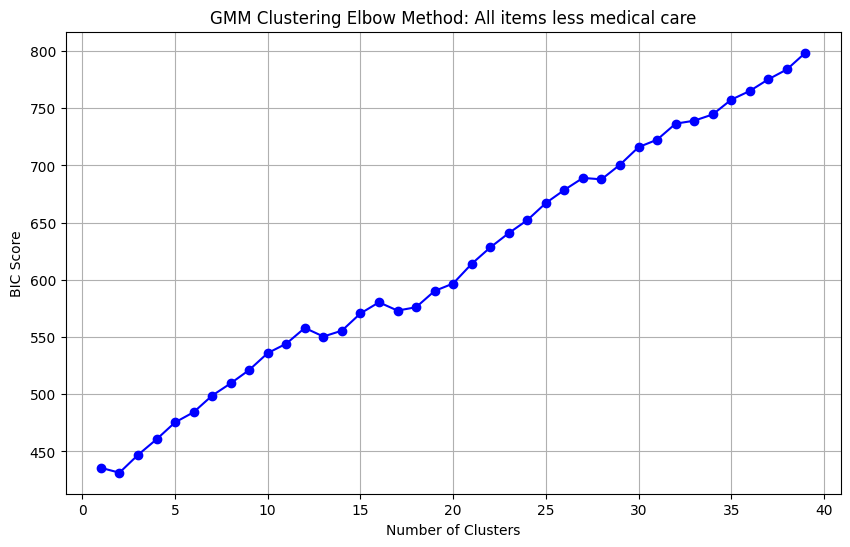

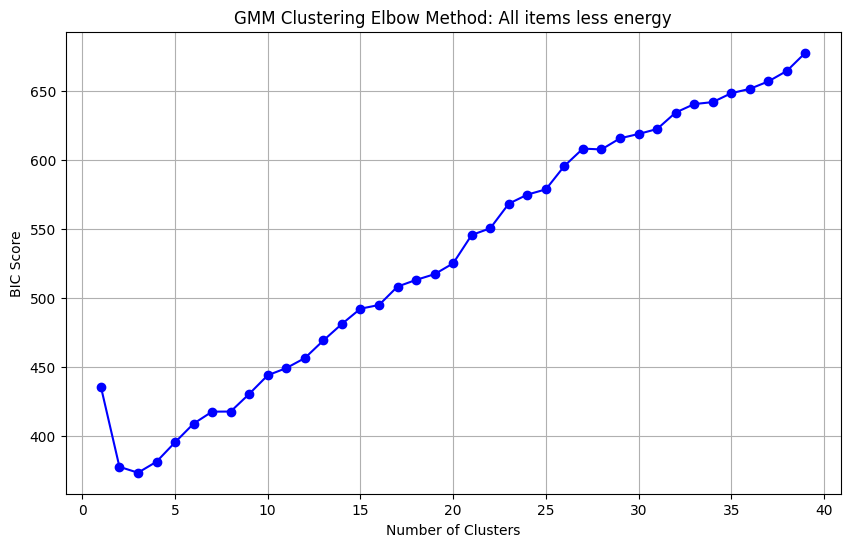

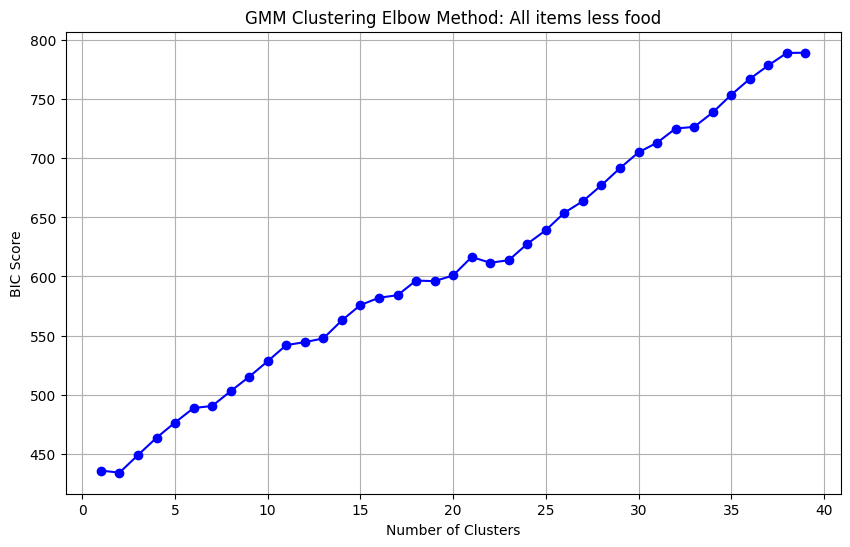

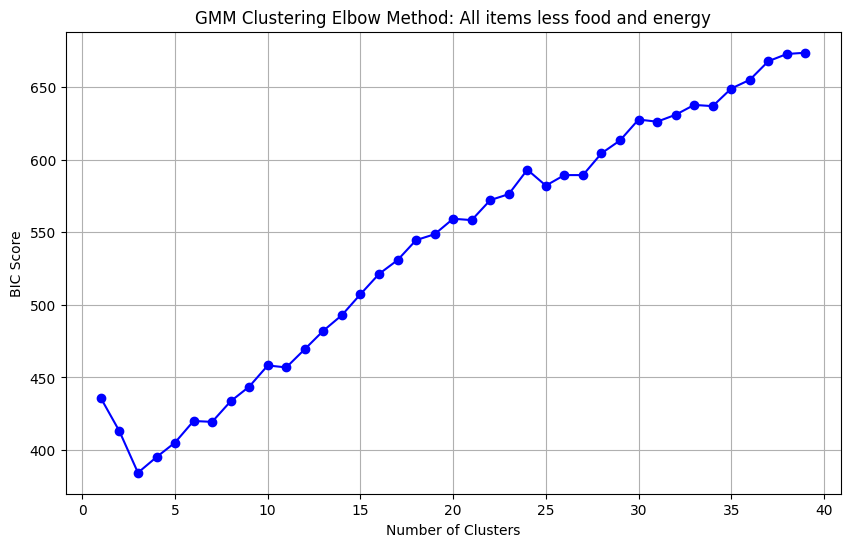

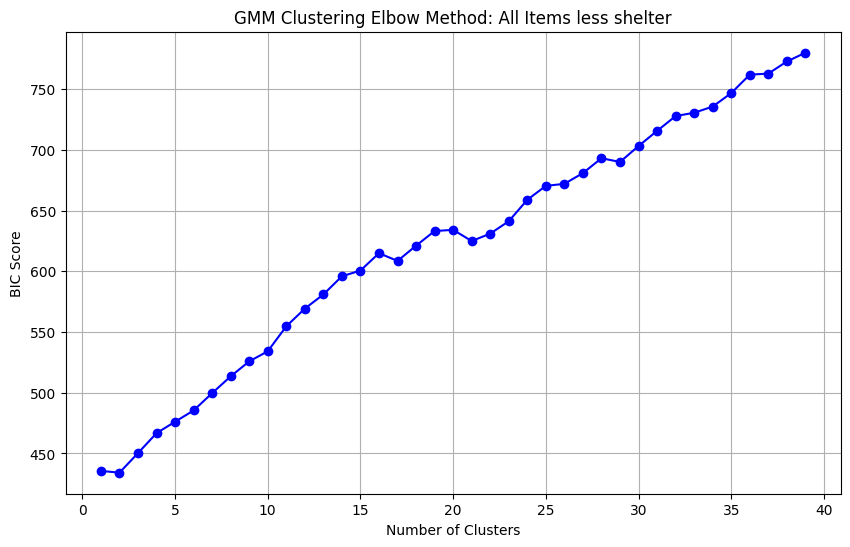

...

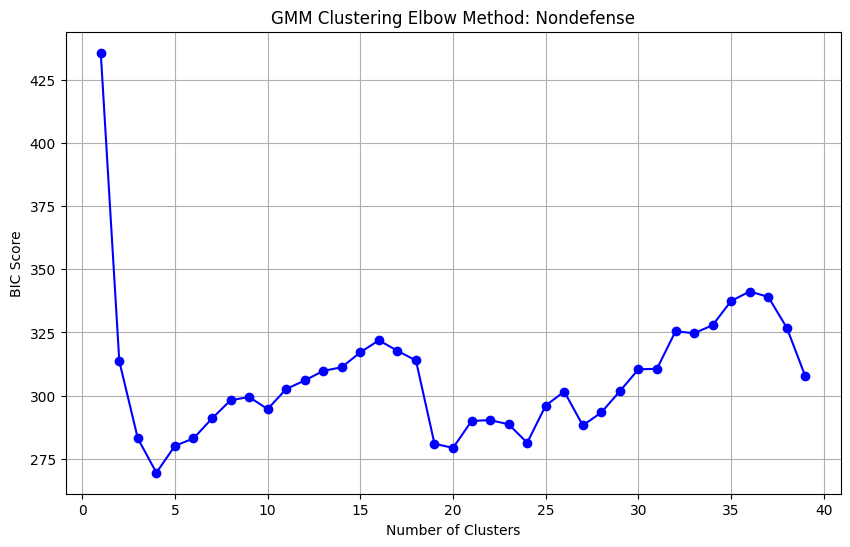

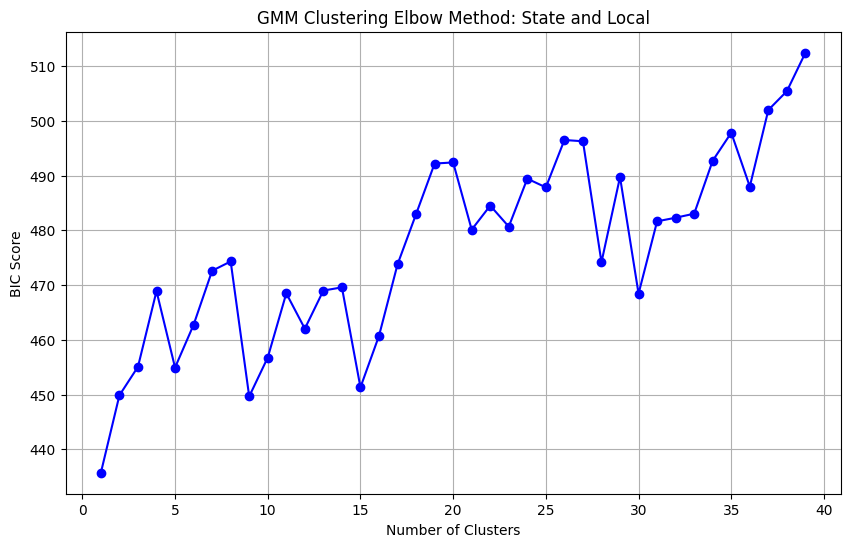

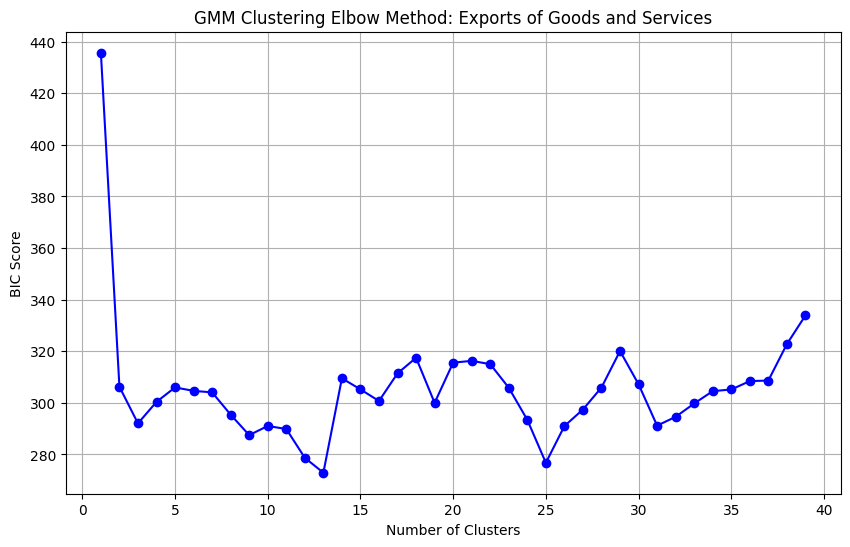

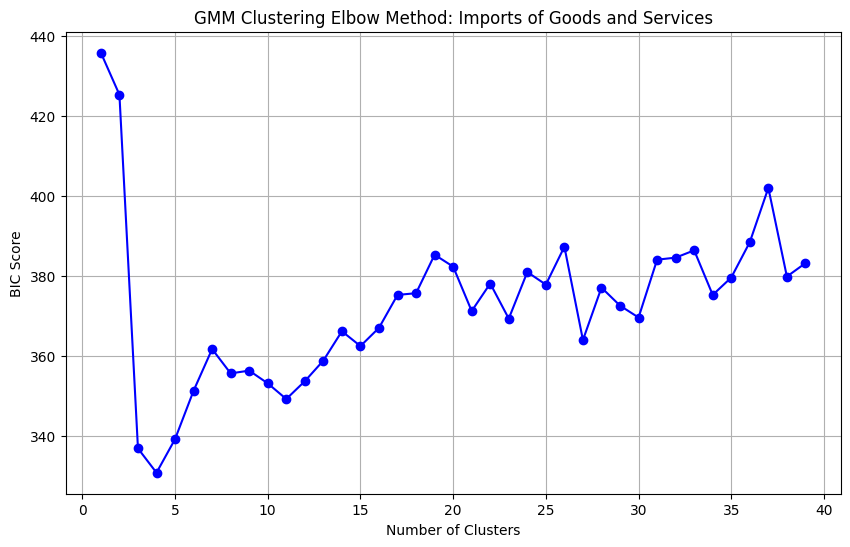

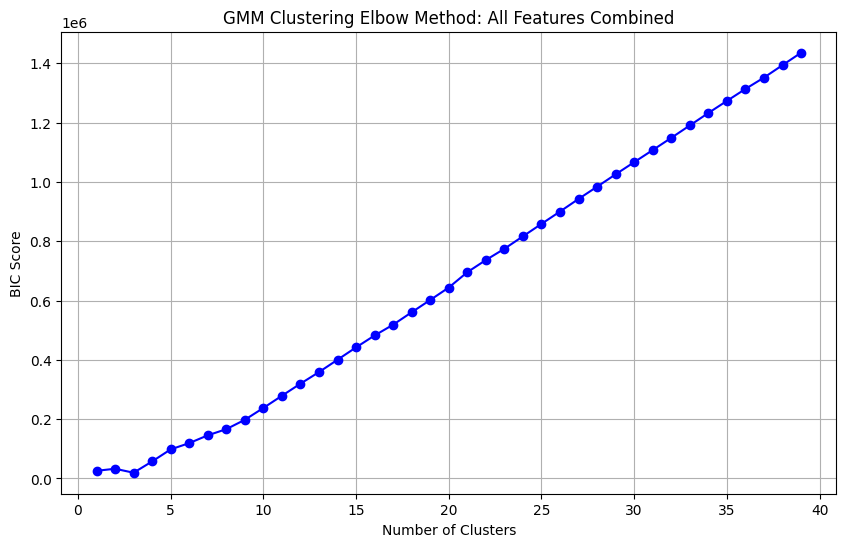

In [353]:
analyze_clustering(macro_data)

In [354]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import cdist
from matplotlib.gridspec import GridSpec
import matplotlib.cm as cm
from sklearn.decomposition import PCA

def plot_gmm_analysis(macro_data, X, cluster_labels, gmm_model, scaler):
    """Create comprehensive visualizations for GMM clustering analysis using matplotlib."""
    # Create figure with multiple subplots
    fig = plt.figure(figsize=(20, 30))
    gs = GridSpec(6, 2, figure=fig)
    
    # 1. Plot first two principal components of macro features
    numeric_features = macro_data.select_dtypes(include=[np.number]).columns
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(scaler.transform(macro_data[numeric_features]))
    
    ax1 = fig.add_subplot(gs[0, :])
    scatter = ax1.scatter(pca_result[:, 0], pca_result[:, 1], 
                         c=cluster_labels + 1, 
                         cmap='viridis', 
                         s=100)
    ax1.set_xlabel('First Principal Component', fontsize=12)
    ax1.set_ylabel('Second Principal Component', fontsize=12)
    ax1.set_title('Economic Regimes: PCA Visualization', fontsize=14)
    ax1.grid(True)
    plt.colorbar(scatter, ax=ax1, label='Cluster')
    
    # 2. Plot clusters over time
    ax2 = fig.add_subplot(gs[1, :])
    ax2.plot(macro_data.index, cluster_labels + 1, 'o-', linewidth=2)
    ax2.set_xlabel('Date', fontsize=12)
    ax2.set_ylabel('Cluster', fontsize=12)
    ax2.set_title('Economic Regime Evolution Over Time', fontsize=14)
    ax2.grid(True)
    
    # 3. Plot mean macro features by cluster
    cluster_stats = pd.DataFrame()
    for cluster in range(len(np.unique(cluster_labels))):
        mask = cluster_labels == cluster
        cluster_stats[f'Cluster {cluster+1}'] = macro_data.loc[mask, numeric_features].mean()
    
    ax3 = fig.add_subplot(gs[2, :])
    cluster_stats.T.plot(kind='bar', ax=ax3)
    ax3.set_title('Mean Macro Features by Cluster', fontsize=14)
    ax3.set_xlabel('Cluster', fontsize=12)
    ax3.set_ylabel('Value', fontsize=12)
    ax3.tick_params(axis='x', rotation=45)
    ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # 4. Plot feature correlations within clusters
    for i, cluster in enumerate(range(len(np.unique(cluster_labels)))):
        ax = fig.add_subplot(gs[3+i, :])
        mask = cluster_labels == cluster
        corr_matrix = macro_data.loc[mask, numeric_features].corr()
        
        # Create correlation heatmap using matplotlib
        im = ax.imshow(corr_matrix, cmap='coolwarm', aspect='auto', vmin=-1, vmax=1)
        
        # Add colorbar
        plt.colorbar(im, ax=ax)
        
        # Add feature labels
        ax.set_xticks(np.arange(len(numeric_features)))
        ax.set_yticks(np.arange(len(numeric_features)))
        ax.set_xticklabels(numeric_features, rotation=45, ha='right')
        ax.set_yticklabels(numeric_features)
        
        # Add correlation values
        for i in range(len(numeric_features)):
            for j in range(len(numeric_features)):
                text = ax.text(j, i, f'{corr_matrix.iloc[i, j]:.2f}',
                             ha="center", va="center", color="black")
        
        ax.set_title(f'Feature Correlations - Cluster {cluster+1}', fontsize=14)
    
    plt.tight_layout()
    plt.show()

    # 5. Additional plot: Feature distributions by cluster
    n_features = len(numeric_features)
    n_clusters = len(np.unique(cluster_labels))
    
    fig, axes = plt.subplots(n_features, 1, figsize=(15, 5*n_features))
    fig.suptitle('Feature Distributions by Cluster', fontsize=16)
    
    for idx, feature in enumerate(numeric_features):
        ax = axes[idx]
        for cluster in range(n_clusters):
            mask = cluster_labels == cluster
            feature_data = macro_data.loc[mask, feature]
            ax.hist(feature_data, bins=20, alpha=0.5, 
                   label=f'Cluster {cluster+1}', density=True)
        ax.set_title(f'{feature} Distribution')
        ax.set_xlabel(feature)
        ax.set_ylabel('Density')
        ax.legend()
        ax.grid(True)
    
    plt.tight_layout()
    plt.show()

# Rest of the code remains the same...

def analyze_gmm_clusters(macro_data, asset_returns, gmm_model, cluster_labels, scaler):
    """Analyze asset returns across different GMM clusters."""
    # Add cluster labels to macro_data
    macro_data = macro_data.copy()
    macro_data['Cluster'] = cluster_labels
    
    # Ensure dates are datetime
    macro_data.index = pd.to_datetime(macro_data.index)
    asset_returns.index = pd.to_datetime(asset_returns.index)
    
    # Merge cluster information with returns
    combined_data = asset_returns.merge(
        macro_data,
        left_index=True,
        right_index=True,
        how='left'
    )
    
    # Calculate cluster statistics
    cluster_stats = pd.DataFrame()
    numeric_features = macro_data.select_dtypes(include=[np.number]).columns
    
    for cluster in range(gmm_model.n_components):
        cluster_data = combined_data[combined_data['Cluster'] == cluster]
        
        # Calculate statistics for each feature and sector
        mean_returns = cluster_data[asset_returns.columns].mean()
        volatility = cluster_data[asset_returns.columns].std()
        sharpe = mean_returns / volatility
        macro_means = cluster_data[numeric_features].mean()
        
        # Store results
        cluster_stats[f'Cluster_{cluster+1}_Mean'] = mean_returns
        cluster_stats[f'Cluster_{cluster+1}_Vol'] = volatility
        cluster_stats[f'Cluster_{cluster+1}_Sharpe'] = sharpe
        for feature in numeric_features:
            cluster_stats.loc[feature, f'Cluster_{cluster+1}_Mean'] = macro_means[feature]
    
    return cluster_stats, combined_data

# Example usage:
"""
# Prepare your data
numeric_features = macro_data.select_dtypes(include=[np.number]).columns

# Fit GMM with optimal number of clusters (e.g., 3)
gmm_model, cluster_labels, scaler = fit_optimal_gmm(macro_data[numeric_features], 3)

# Create visualizations
plot_gmm_analysis(macro_data, X, cluster_labels, gmm_model, scaler)
"""

'\n# Prepare your data\nnumeric_features = macro_data.select_dtypes(include=[np.number]).columns\n\n# Fit GMM with optimal number of clusters (e.g., 3)\ngmm_model, cluster_labels, scaler = fit_optimal_gmm(macro_data[numeric_features], 3)\n\n# Create visualizations\nplot_gmm_analysis(macro_data, X, cluster_labels, gmm_model, scaler)\n'

In [355]:
gmm_model, cluster_labels, scaler = fit_optimal_gmm(macro_data[numeric_features], 3)


C:\Users\wkaco\AppData\Local\Temp\ipykernel_23332\2780634794.py:81: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


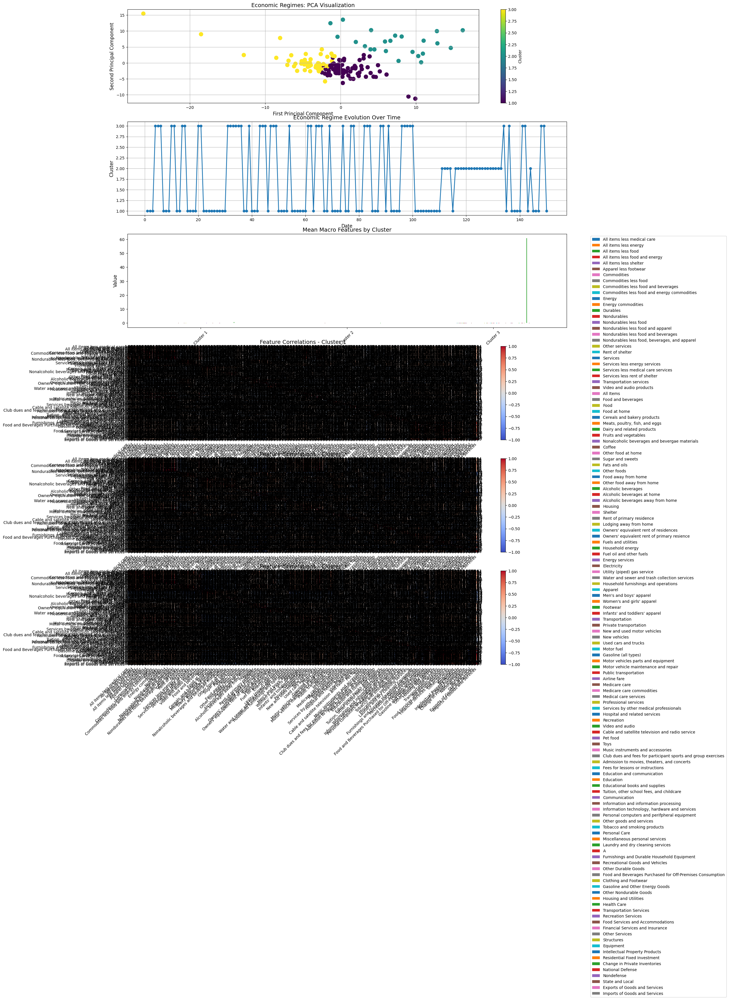

In [356]:
plot_gmm_analysis(macro_data, X, cluster_labels, gmm_model, scaler)

In [357]:
print("\nCluster Summary:")
print(cluster_summary)
print("\nCluster Statistics:")
print(cluster_stats)


Cluster Summary:


NameError: name 'cluster_summary' is not defined